In [ ]:
# The following code will only execute
# successfully when compression is complete

import kagglehub

# Download latest version
path = kagglehub.dataset_download("phanvnvinhs2564cntt/plantcustom")

print("Path to dataset files:", path)

In [1]:
import os

# Đường dẫn tới train/valid
train_dir = "/kaggle/input/plantcustom/data/train"
valid_dir = "/kaggle/input/plantcustom/data/valid"

def count_images_per_class(folder):
    counts = {}
    for class_name in os.listdir(folder):
        class_path = os.path.join(folder, class_name)
        if os.path.isdir(class_path):
            counts[class_name] = len(os.listdir(class_path))
    return counts

# Thống kê train
train_counts = count_images_per_class(train_dir)
print("Train:")
for cls, cnt in train_counts.items():
    print(f"{cls}: {cnt} ảnh")
print("Tổng class train:", len(train_counts))

# Thống kê valid
valid_counts = count_images_per_class(valid_dir)
print("\nValid:")
for cls, cnt in valid_counts.items():
    print(f"{cls}: {cnt} ảnh")
print("Tổng class valid:", len(valid_counts))


Train:
Tomato___Late_blight: 1400 ảnh
Tomato___healthy: 1200 ảnh
Grape___healthy: 1200 ảnh
Orange___Haunglongbing_(Citrus_greening): 1200 ảnh
Soybean___healthy: 1200 ảnh
Squash___Powdery_mildew: 1400 ảnh
Potato___healthy: 1152 ảnh
Corn_(maize)___Northern_Leaf_Blight: 1400 ảnh
Tomato___Early_blight: 1400 ảnh
Tomato___Septoria_leaf_spot: 1400 ảnh
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot: 1400 ảnh
Strawberry___Leaf_scorch: 1200 ảnh
Peach___healthy: 1200 ảnh
Apple___Apple_scab: 1502 ảnh
Tomato___Tomato_Yellow_Leaf_Curl_Virus: 1400 ảnh
Tomato___Bacterial_spot: 1400 ảnh
Apple___Black_rot: 1200 ảnh
Blueberry___healthy: 1200 ảnh
Cherry_(including_sour)___Powdery_mildew: 1200 ảnh
Peach___Bacterial_spot: 1200 ảnh
Apple___Cedar_apple_rust: 1496 ảnh
Tomato___Target_Spot: 1200 ảnh
Pepper,_bell___healthy: 1378 ảnh
Grape___Leaf_blight_(Isariopsis_Leaf_Spot): 1200 ảnh
Potato___Late_blight: 1400 ảnh
Tomato___Tomato_mosaic_virus: 1400 ảnh
Strawberry___healthy: 1200 ảnh
Apple___healthy: 1502 ản

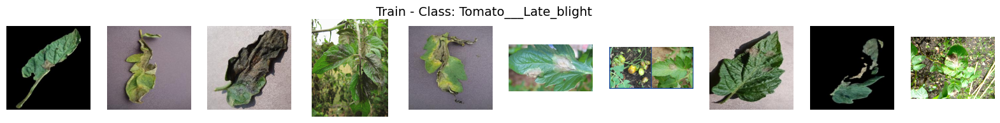

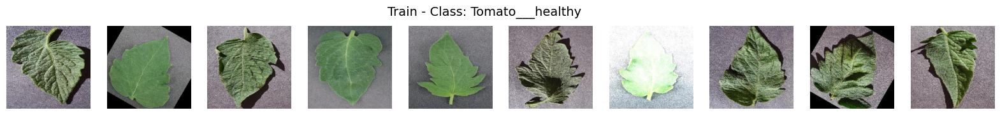

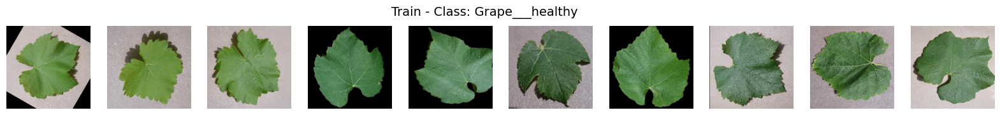

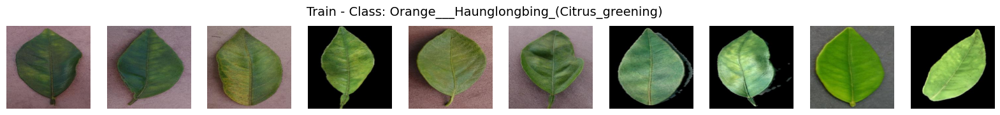

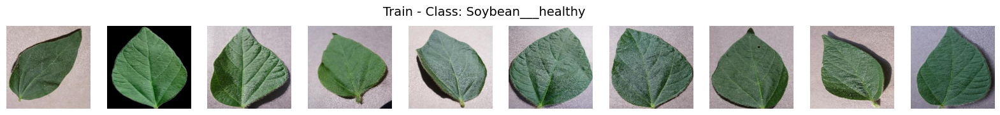

...

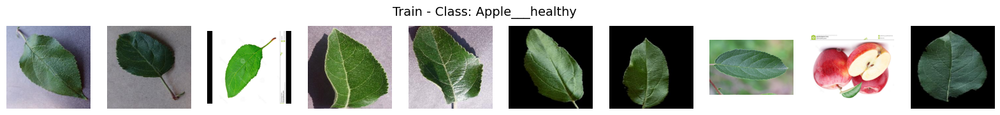

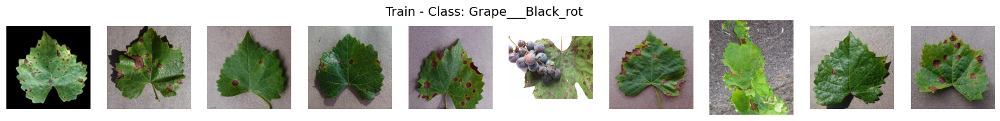

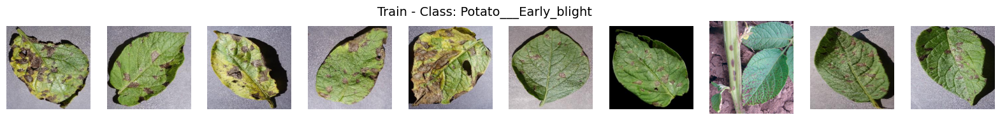

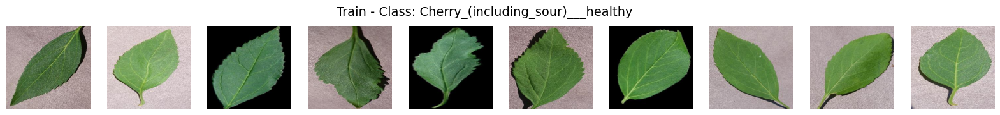

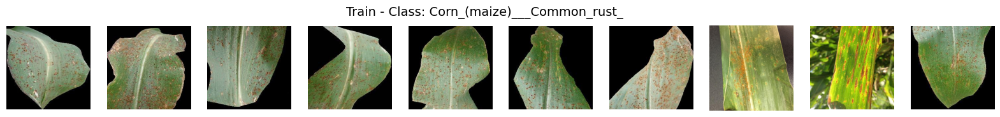

In [ ]:
import os
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

def show_random_images(folder, num_images=10, title=""):
    class_names = [c for c in os.listdir(folder) if os.path.isdir(os.path.join(folder, c))]
    
    for cls in class_names:
        cls_path = os.path.join(folder, cls)
        imgs = os.listdir(cls_path)
        if len(imgs) == 0:
            continue
        
        # Chọn ngẫu nhiên num_images hình
        sample_imgs = random.sample(imgs, min(num_images, len(imgs)))
        
        plt.figure(figsize=(20, 2))
        plt.suptitle(f"{title} - Class: {cls}", fontsize=14)
        
        for i, img_name in enumerate(sample_imgs):
            img_path = os.path.join(cls_path, img_name)
            img = mpimg.imread(img_path)
            plt.subplot(1, len(sample_imgs), i+1)
            plt.imshow(img)
            plt.axis('off')
        
        plt.show()

# Hiển thị ngẫu nhiên 10 hình mỗi class trong train
show_random_images(train_dir, num_images=10, title="Train")

# Hiển thị ngẫu nhiên 10 hình mỗi class trong valid
show_random_images(valid_dir, num_images=10, title="Valid")


In [9]:
# Cell 1: Import và thiết lập cơ bản
# ===================================
import os
import time
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import transforms, datasets
import timm
from tqdm import tqdm
from PIL import Image

In [7]:


# Thiết bị
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)

# Đường dẫn
TRAIN_DIR = "/kaggle/input/plantcustom/data/train"
VAL_DIR = "/kaggle/input/plantcustom/data/valid"

Device: cuda


In [8]:
# Cell 2: Data transforms cho caformer
# ====================================
IMG_SIZE = 224

# Data augmentation cho caformer
train_tfms = transforms.Compose([
    transforms.RandomResizedCrop(IMG_SIZE, scale=(0.7, 1.0)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

val_tfms = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(IMG_SIZE),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# Load datasets
train_dataset = datasets.ImageFolder(TRAIN_DIR, transform=train_tfms)
val_dataset = datasets.ImageFolder(VAL_DIR, transform=val_tfms)

print(f"Train samples: {len(train_dataset)}")
print(f"Val samples: {len(val_dataset)}")
print(f"Classes: {len(train_dataset.classes)}")

Train samples: 49630
Val samples: 8269
Classes: 38


In [10]:
# Cell 3: DataLoaders
# ===================
BATCH_SIZE = 32
NUM_WORKERS = 4

train_loader = DataLoader(
    train_dataset, 
    batch_size=BATCH_SIZE, 
    shuffle=True, 
    num_workers=NUM_WORKERS,
    pin_memory=True
)

val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS, 
    pin_memory=True
)

print("DataLoaders ready!")

DataLoaders ready!


In [11]:
# Cell 4: Tạo mô hình CaFormer-S18

# Tên mô hình trong thư viện timm (CaFormer-S18, pretrained trên ImageNet-1K)
model_name = "caformer_s18.sail_in1k"

# Tạo mô hình từ timm
model = timm.create_model(
    model_name, 
    pretrained=True,                         # dùng trọng số pretrained trên ImageNet
    num_classes=len(train_dataset.classes),  # thay lớp cuối cùng theo số lớp trong tập dữ liệu
    drop_rate=0.1,                           # xác suất dropout (giảm overfitting)
    drop_path_rate=0.05                      # tỉ lệ stochastic depth (bỏ ngẫu nhiên 1 số block)
)

# Đưa mô hình sang thiết bị (GPU nếu có, nếu không dùng CPU)
model = model.to(device)

# In thông tin cơ bản
print(f"Model: {model_name}")
print(f"Number of classes: {len(train_dataset.classes)}")

# Đếm tổng số tham số và tham số có thể huấn luyện
total_params = sum(p.numel() for p in model.parameters())                # tổng số tham số
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)  # tham số trainable

# In ra thống kê
print(f"Total params: {total_params:,}")
print(f"Trainable params: {trainable_params:,}")


model.safetensors:   0%|          | 0.00/105M [00:00<?, ?B/s]

Model: caformer_s18.sail_in1k
Number of classes: 38
Total params: 24,370,518
Trainable params: 24,370,518


In [12]:
# Cell 5: Loss function và Optimizer cho CaFormer

# CrossEntropyLoss dùng cho phân loại nhiều lớp
# label_smoothing=0.1 giúp làm mềm nhãn thật (giảm overfitting, tránh mô hình quá tự tin)
criterion = nn.CrossEntropyLoss(label_smoothing=0.1)

# Optimizer (Bộ tối ưu hóa)
# AdamW là phiên bản cải tiến của Adam, tách weight_decay ra riêng, phù hợp cho mô hình transformer
optimizer = optim.AdamW(
    model.parameters(),  # tham số cần tối ưu (toàn bộ mô hình)
    lr=3e-4,             # tốc độ học (learning rate)
    weight_decay=0.05,   # phạt trọng số lớn để tránh overfitting
    betas=(0.9, 0.999)   # hệ số momen cho Adam (giữ mặc định là tốt)
)

# Scheduler (lịch thay đổi learning rate)
# CosineAnnealingWarmRestarts giảm LR theo sóng cosine và reset định kỳ
scheduler = optim.lr_scheduler.CosineAnnealingWarmRestarts(
    optimizer, 
    T_0=10,     # số epoch cho chu kỳ đầu tiên
    T_mult=2,   # mỗi lần reset sẽ nhân đôi độ dài chu kỳ (10 → 20 → 40...)
    eta_min=1e-6  # learning rate nhỏ nhất
)

# Gradient Scaler (dùng cho mixed precision training)
# Giúp huấn luyện FP16 trên GPU nhanh hơn, ổn định hơn và tránh tràn số
scaler = torch.amp.GradScaler('cuda')


In [13]:
# Cell 6: Hàm train và validate
# =============================

def train_epoch(model, loader, optimizer, criterion, scaler):
    model.train()  # Đặt model ở chế độ huấn luyện (bật dropout, batchnorm, v.v.)
    running_loss = 0.0  # Tổng loss trong epoch
    correct = 0         # Số mẫu dự đoán đúng
    total = 0           # Tổng số mẫu
    start_time = time.time()  # Ghi lại thời gian bắt đầu epoch
    
    pbar = tqdm(loader, desc='Training')  # Thanh tiến trình để hiển thị quá trình train
    for batch_idx, (images, labels) in enumerate(pbar):
        images, labels = images.to(device), labels.to(device)  # Chuyển dữ liệu sang GPU
        
        optimizer.zero_grad()  # Reset gradient trước mỗi batch
        
        # Huấn luyện với mixed precision để tiết kiệm VRAM, tăng tốc GPU
        with torch.amp.autocast('cuda'):
            outputs = model(images)              # Dự đoán đầu ra
            loss = criterion(outputs, labels)    # Tính loss (CrossEntropy)
        
        # Tính gradient có scale để tránh underflow trong mixed precision
        scaler.scale(loss).backward()     # Lan truyền ngược (backprop)
        scaler.step(optimizer)            # Cập nhật trọng số
        scaler.update()                   # Cập nhật hệ số scale
        
        # Tính toán độ chính xác và loss trung bình
        running_loss += loss.item() * images.size(0)
        _, predicted = outputs.max(1)              # Lấy class có xác suất cao nhất
        total += labels.size(0)
        correct += predicted.eq(labels).sum().item()
        
        # Cập nhật thanh tiến trình mỗi 20 batch
        if batch_idx % 20 == 0:
            pbar.set_postfix({
                'Loss': f'{loss.item():.4f}',
                'Acc': f'{100.*correct/total:.2f}%'
            })
    
    # Tính loss, accuracy, thời gian trung bình của toàn epoch
    epoch_loss = running_loss / total
    epoch_acc = 100. * correct / total
    epoch_time = time.time() - start_time
    
    return epoch_loss, epoch_acc, epoch_time


@torch.no_grad()  # Không tính gradient (giảm RAM, tăng tốc)
def validate(model, loader, criterion):
    model.eval()  # Đặt model ở chế độ đánh giá (tắt dropout, batchnorm cố định)
    running_loss = 0.0
    correct = 0
    total = 0
    start_time = time.time()
    
    pbar = tqdm(loader, desc='Validation')
    for images, labels in pbar:
        images, labels = images.to(device), labels.to(device)
        
        # Sử dụng mixed precision trong quá trình inference
        with torch.amp.autocast('cuda'):
            outputs = model(images)
            loss = criterion(outputs, labels)
        
        # Cập nhật loss và accuracy
        running_loss += loss.item() * images.size(0)
        _, predicted = outputs.max(1)
        total += labels.size(0)
        correct += predicted.eq(labels).sum().item()
        
    # Tổng hợp kết quả sau khi duyệt toàn bộ tập validation
    epoch_loss = running_loss / total
    epoch_acc = 100. * correct / total
    epoch_time = time.time() - start_time
    
    return epoch_loss, epoch_acc, epoch_time


In [ ]:
# Cell 7: Training loop cho caformer
# ==================================

NUM_EPOCHS = 50          # Số epoch huấn luyện tối đa
best_acc = 0.0            # Lưu độ chính xác cao nhất đạt được trên tập validation
patience = 8              # Số epoch cho phép không cải thiện trước khi dừng sớm (early stopping)
patience_counter = 0      # Biến đếm số lần liên tiếp không cải thiện

# Các list để lưu lại lịch sử huấn luyện và đánh giá theo epoch
train_losses, val_losses = [], []
train_accs, val_accs = [], []

print("Bắt đầu training với caformer_s18...")
print(f"{'Epoch':^6} | {'Time':^8} | {'Train Loss':^10} | {'Train Acc':^9} | {'Val Loss':^10} | {'Val Acc':^8} | {'LR':^10}")
print("-" * 80)

# Vòng lặp chính qua từng epoch
for epoch in range(NUM_EPOCHS):
    epoch_start = time.time()  # Ghi lại thời gian bắt đầu epoch
    
    # === Giai đoạn train ===
    train_loss, train_acc, train_time = train_epoch(
        model, train_loader, optimizer, criterion, scaler
    )
    
    # === Giai đoạn validation ===
    val_loss, val_acc, val_time = validate(model, val_loader, criterion)
    
    # Cập nhật scheduler theo chu kỳ (CosineAnnealingWarmRestarts)
    scheduler.step(epoch + 1)
    
    # Lấy learning rate hiện tại để in ra
    current_lr = optimizer.param_groups[0]['lr']
    
    # Lưu kết quả của epoch vào lịch sử
    train_losses.append(train_loss)
    val_losses.append(val_loss)
    train_accs.append(train_acc)
    val_accs.append(val_acc)
    
    # Tính tổng thời gian 1 epoch
    total_time = time.time() - epoch_start
    
    # In thông tin epoch
    print(f"{epoch+1:^6} | {total_time:^8.1f} | {train_loss:^10.4f} | {train_acc:^8.2f}% | "
          f"{val_loss:^10.4f} | {val_acc:^7.2f}% | {current_lr:^10.2e}")
    
    # === Lưu model tốt nhất ===
    if val_acc > best_acc:
        best_acc = val_acc
        patience_counter = 0  # Reset bộ đếm kiên nhẫn vì có cải thiện
        
        # Lưu checkpoint "best model"
        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'scheduler_state_dict': scheduler.state_dict(),
            'best_acc': best_acc,
            'train_loss': train_loss,
            'val_loss': val_loss,
            'train_acc': train_acc,
            'val_acc': val_acc,
        }, 'best_caformer_model.pth')
        
        print(f"🎉 New best accuracy: {best_acc:.2f}% - Model saved!")
    else:
        # Nếu không cải thiện, tăng bộ đếm kiên nhẫn
        patience_counter += 1
    
    # === Kiểm tra early stopping ===
    if patience_counter >= patience:
        print(f" Early stopping at epoch {epoch+1}")
        print(f" Best accuracy: {best_acc:.2f}%")
        break

    # === Lưu checkpoint định kỳ mỗi 10 epoch ===
    if (epoch + 1) % 10 == 0:
        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'scheduler_state_dict': scheduler.state_dict(),
            'best_acc': best_acc,
        }, f'caformer_checkpoint_epoch_{epoch+1}.pth')
        print(f" Checkpoint saved at epoch {epoch+1}")

# Kết thúc quá trình train
print("\n" + "="*80)
print(f" TRAINING COMPLETED!")
print(f" Best Validation Accuracy: {best_acc:.2f}%")


In [ ]:
import shutil

# File model best
best_model_path = "best_caformer_model.pth"

# Copy ra thư mục /kaggle/working để dễ tải về
shutil.copy(best_model_path, "/kaggle/working/best_caformer_model.pth")

print(" File đã sẵn sàng tải xuống: /kaggle/working/best_caformer_model.pth")


In [14]:
import shutil

# Sao chép file model từ thư mục input sang working dir
shutil.copy("/kaggle/input/cafomer/other/default/1/best_caformer_model.pth", "best_caformer_model.pth")

print("Đã sao chép model, sẵn sàng load.")


Đã sao chép model, sẵn sàng load.


In [16]:
checkpoint = torch.load('best_caformer_model.pth')
model.load_state_dict(checkpoint['model_state_dict'])


<All keys matched successfully>

In [17]:
# Cell 8: Đánh giá model cuối cùng
# ================================
print("Đánh giá caformer model cuối cùng...")

# Load best model
checkpoint = torch.load('best_caformer_model.pth')
model.load_state_dict(checkpoint['model_state_dict'])

# Validate với best model
final_loss, final_acc, final_time = validate(model, val_loader, criterion)
print(f"\n FINAL RESULTS:")
print(f"Validation Accuracy: {final_acc:.2f}%")
print(f"Validation Loss: {final_loss:.4f}")
print(f"Inference Time: {final_time:.2f}s")

# Hàm dự đoán ảnh đơn
def predict_image(image_path, model, transform, class_names):
    model.eval()
    image = Image.open(image_path).convert('RGB')
    image = transform(image).unsqueeze(0).to(device)
    
    with torch.no_grad():
        with torch.amp.autocast('cuda'):
            output = model(image)
            probabilities = torch.softmax(output, dim=1)
            confidence, predicted = torch.max(probabilities, 1)
    
    predicted_class = class_names[predicted.item()]
    return predicted_class, confidence.item()

# Ví dụ sử dụng:
# class_names = train_dataset.classes
# result, conf = predict_image("path_to_image.jpg", model, val_tfms, class_names)
# print(f"Predicted: {result} (Confidence: {conf:.3f})")

Đánh giá caformer model cuối cùng...


Validation: 100%|██████████| 259/259 [00:43<00:00,  5.95it/s]


 FINAL RESULTS:
Validation Accuracy: 96.81%
Validation Loss: 0.7933
Inference Time: 43.51s


In [ ]:
# Cell 9: Vẽ biểu đồ training (optional)
# ======================================
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 5))

# Biểu đồ loss
plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Train Loss')
plt.plot(val_losses, label='Val Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

# Biểu đồ accuracy
plt.subplot(1, 2, 2)
plt.plot(train_accs, label='Train Accuracy')
plt.plot(val_accs, label='Val Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy (%)')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.savefig('caformer_training_history.png', dpi=300, bbox_inches='tight')
plt.show()

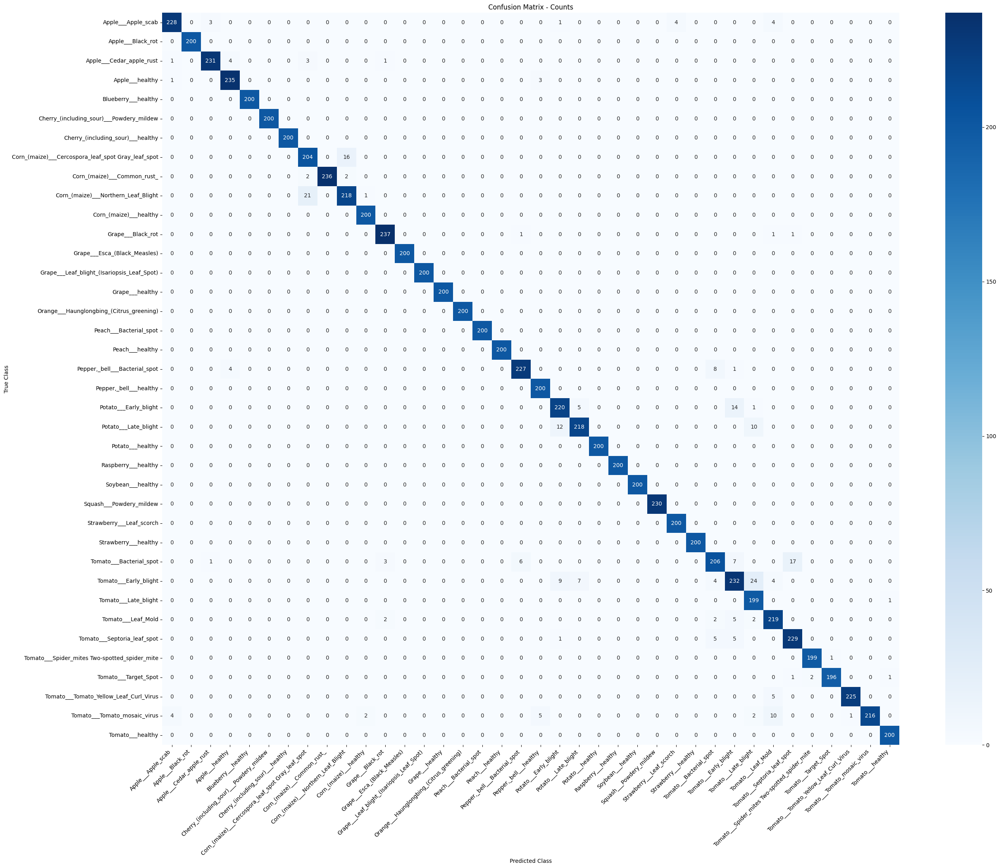

In [20]:
import torch
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
import numpy as np

# Đặt model ở chế độ đánh giá
model.eval()

all_preds = []
all_labels = []

# Duyệt toàn bộ validation set
with torch.no_grad():
    for images, labels in val_loader:
        images, labels = images.to(device), labels.to(device)
        with torch.amp.autocast('cuda'):
            outputs = model(images)
        preds = torch.argmax(outputs, dim=1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

# Tính confusion matrix (số lần)
cm = confusion_matrix(all_labels, all_preds)

# Vẽ heatmap theo số lần dự đoán
plt.figure(figsize=(30, 24))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=train_dataset.classes,
            yticklabels=train_dataset.classes)
plt.xlabel("Predicted Class")
plt.ylabel("True Class")
plt.title("Confusion Matrix - Counts")
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)
plt.show()
